# End-to-End Multi-Class Dog Breed Classification
This notebook builds an end-to-end multi-class image classifier using TensorFlow.

## 1. Problem
Identifying the breed of a dog given an image of a dog.

## 2. Data
The data we're using is from Kaggle's dog breed identification competition:
https://kaggle.com/c/dog-breed-identification/data

## 3. Evaluation
The evaluation is a file with prediction probabilities for each dog breed of each test image:
https://kaggle.com/c/dog-breed-identification/overview/evaluation

## 4. Features
Some information about the data:
* We're dealing with unstructured data (images) - so it's probably best that we use deep learning/transfer learning
* There are 120 breeds of dogs (this means there are 120 different classes)
* There are around 10,000+ images in the training set (these images have labels)
* There are around 10,000+ images in the test set (these images do not have labels)

In [3]:
# Setup our environment
import os
import datetime as dt
from typing import Tuple, Union, List, Optional
from IPython.display import Image

import tensorflow as tf
import tensorflow_hub as hub

from keras import Sequential
from keras.callbacks import TensorBoard

import pandas as pd
from pandas import DataFrame

import numpy as np

import matplotlib.pyplot as plt
from matplotlib.pyplot import imread

from sklearn.model_selection import train_test_split

os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'

## Getting our data ready (turning into Tensors)

With all machine learning models, our data has to be in numerical format. So that's what we'll be doing first. Turning our images into numerical representations (Tensors)

In [4]:
labels_csv = pd.read_csv('data/dog-breed-identification/labels.csv')
print(labels_csv.describe())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126


In [5]:
print(labels_csv.head())

                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


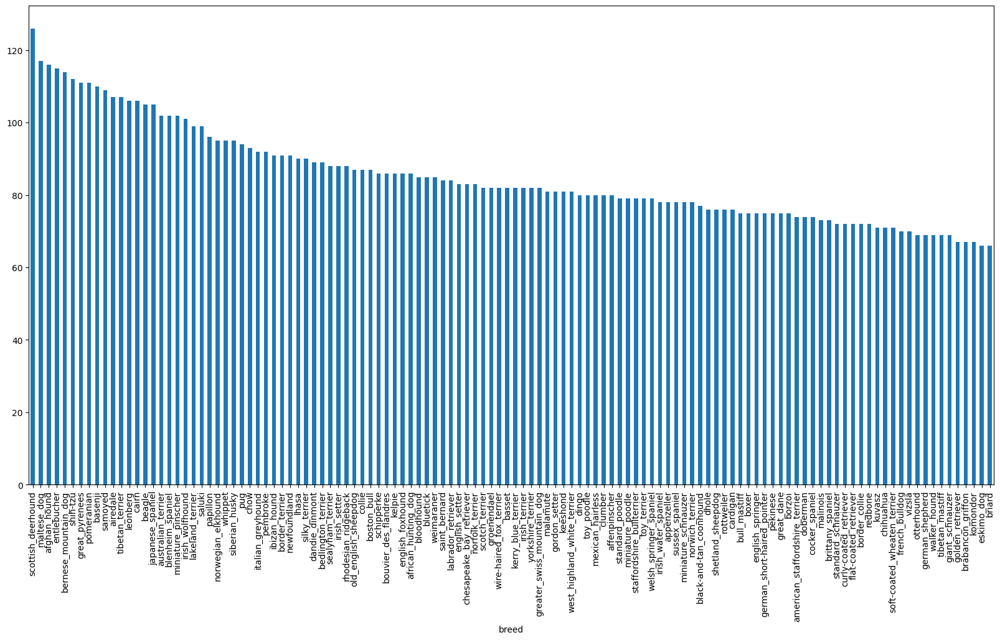

In [6]:
# How many images are there of each breed?
labels_csv['breed'].value_counts().plot.bar(figsize = (20, 10));

In [7]:
labels_csv['breed'].value_counts().median()

82.0

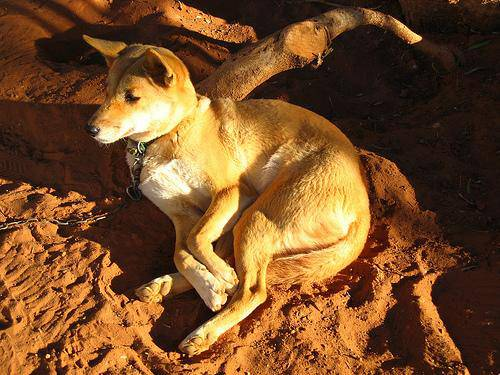

In [8]:
# Let's view an image
Image('data/dog-breed-identification/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg')

### Getting images and their labels

Let's get a list of all our image file path-names

In [9]:
# Create path-names from image ID's
filenames = ['data/dog-breed-identification/train/' + file_id + '.jpg' for file_id in labels_csv['id']]

# Check the first 10
filenames[:10]

['data/dog-breed-identification/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'data/dog-breed-identification/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'data/dog-breed-identification/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'data/dog-breed-identification/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'data/dog-breed-identification/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'data/dog-breed-identification/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'data/dog-breed-identification/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'data/dog-breed-identification/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'data/dog-breed-identification/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'data/dog-breed-identification/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [10]:
# Check whether number of file names matches actual number of image files
if len(os.listdir('data/dog-breed-identification/train/')) == len(filenames):
    print('File-names match number of image files.')
else:
    print('File-names do not match number of image files; check target directory.')

File-names match number of image files.


Since we've now got our training image file-paths in a list, let's prepare our labels.

In [11]:
labels = labels_csv['breed'].to_numpy()
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [12]:
len(labels)

10222

In [12]:
# See if number of labels matches the number of file-names
if len(labels) == len(filenames):
    print('Number of labels matches number of file-names.')
else:
    print('Number of labels does not match number of file-names; check target directory.')

Number of labels matches number of file-names.


In [14]:
# Find the unique label values
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [104]:
# Turn a single label into an array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [173]:
# Turn every label into a boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:1]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False])]

In [17]:
len(boolean_labels)

10222

In [16]:
# Turning boolean array into integers
print(labels[0])  # original label
print(np.where(unique_breeds == labels[0]))  # index where label occurs
print(boolean_labels[0].argmax())  # index where label occurs in boolean array
print(boolean_labels[0].astype(int))  # there will be a 1 where the sample occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


### Creating our own validation set
Since the dataset from Kaggle doesn't come with a validation set, we will create our own.

In [17]:
# Setup X and y variables
X = filenames
y = boolean_labels

We're going to start experimenting with 10,000 images and increase as needed.

In [18]:
# Set number of images to use for experimenting
NUM_IMAGES = 1000

In [19]:
# Let's split our data into train and validation sets
X_train, X_val, y_train, y_val = train_test_split(
    X[:NUM_IMAGES],
    y[:NUM_IMAGES],
    test_size = 0.2,
    random_state = 42,
)

len(X_train), len(X_val), len(y_train), len(y_val)

(800, 200, 800, 200)

In [20]:
# Let's have a look at the training data
X_train[:1], y_train[:1]

(['data/dog-breed-identification/train/00bee065dcec471f26394855c5c2f3de.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False,

## Preprocessing Images (turning images into Tensors)

To preprocess our images into Tensors we're going to write a function that does a few things:
1. Take an image file-path as input
2. Use TensorFlow to read the file and save it to a variable called `image`
3. Turn `image` (a .jpg file) into Tensors
4. Normalize the image (convert color channel values from 0-255 to 0-1)
5. Resize `image` to ge a shape of (224 x 224)
6. Return modified `image`

In [21]:
# Define image size
IMG_SIZE = 128


def process_image(image_path: str, img_size: int = 128) -> tf.Tensor:
    """
    Takes an image file path and turns the image into a Tensor.
    :param img_size: the image size (128 by default).
    :param image_path: local file path of an image.
    :return: A Tensor representing the processed image.
    """

    # Read in an image file
    image = tf.io.read_file(image_path)

    # Turn the image into a numerical Tensor with 3 color channels (red, green, and blue)
    image = tf.image.decode_jpeg(image, channels = 3)

    # Convert the color channel values from 0-255 to 0-1 values
    image = tf.image.convert_image_dtype(image, tf.float32)

    # Resize the image to our desired value (224, 224)
    image = tf.image.resize(
        image,
        size = [
            img_size,
            img_size,
        ],
    )
    return image

## Turning our data into batches

Why turn our data into batches?

Let's say you're trying to process 10,000+ images in one go; they all may not fit into memory.

So that's why we do 32 (this is the batch size) images at a time.

To use TensorFlow effectively, we need our data in the form of Tensor tuples, which look like this:
`(image, label)`.

In [22]:
# Create a function to return a tuple (image, label)

def get_image_label(image_path: str, label: str) -> Tuple[tf.Tensor, str]:
    """
    Takes an image file-path name and the associated label; processes the image and returns a tuple of (image, label).
    :param image_path: local file-path of an image.
    :param label: the label for the associated file-path name.
    :return: A tuple containing the processed image Tensor and the associated label.
    """

    image = process_image(image_path)
    return image, label

In [23]:
# Demo of the above
(process_image(X[42]), y[42])

(<tf.Tensor: shape=(128, 128, 3), dtype=float32, numpy=
 array([[[0.27929032, 0.4751063 , 0.2795834 ],
         [0.27585176, 0.46525738, 0.26177704],
         [0.3406097 , 0.52753276, 0.30271655],
         ...,
         [0.2751685 , 0.49869794, 0.29869792],
         [0.28818935, 0.51209253, 0.31603253],
         [0.29382864, 0.52127963, 0.33304432]],
 
        [[0.21575989, 0.41348663, 0.2655423 ],
         [0.29273564, 0.48136288, 0.32789788],
         [0.3189494 , 0.505239  , 0.33296594],
         ...,
         [0.25343138, 0.47303924, 0.28489584],
         [0.2582874 , 0.4802207 , 0.2991575 ],
         [0.27520525, 0.49873468, 0.32627755]],
 
        [[0.1963847 , 0.39246315, 0.28385404],
         [0.2122244 , 0.4047182 , 0.29629302],
         [0.22513789, 0.41602883, 0.29334742],
         ...,
         [0.22732845, 0.44489893, 0.27724636],
         [0.23500296, 0.45068926, 0.2900581 ],
         [0.25955886, 0.47524515, 0.32041976]],
 
        ...,
 
        [[0.13864364, 0.17785932

Now we've got a way to turn our data into tuples of Tensors in the form: `(image, label)`.
Let's make a function to turn all our data (`X` and `y`) into batches.

In [24]:
# Create a function to turn data into batches.

def create_data_batches(
        X: DataFrame,
        y: Union[None, DataFrame] = None,
        batch_size: int = 32,
        valid_data: bool = False,
        test_data: bool = False,
) -> tf.data.Dataset:
    """
    Creates batches of data out of image (X) and label (y) pairs.
    Shuffles the data if it's training data, but doesn't shuffle if it's validation data. Also accepts test data as input (no labels).
    
    :param X: DataFrame of image file paths.
    :param y: DataFrame of labels associated with the image file paths. Optional for test data.
    :param batch_size: Integer specifying the batch size. Defaults to 32.
    :param valid_data: Boolean flag indicating if the data is validation data. Defaults to False.
    :param test_data: Boolean flag indicating if the data is test data (no labels). Defaults to False.
    :return: A TensorFlow Dataset object containing batches of (image, label) tuples, or just images if it's test data.
    """

    # If the data is a test dataset, we don't have labels.
    if test_data:
        print('Creating test data batches...')
        # Only file-paths (no labels)
        data: tf.DataSet = tf.data.Dataset.from_tensor_slices((
            tf.constant(X),
        ))
        data_batch: tf.Dataset[tf.Tensor] = data.map(process_image).batch(batch_size)
        return data_batch

    # If the data is a validation dataset, we don't need to shuffle it
    elif valid_data:
        print('Creating validation data batches...')
        data: tf.DataSet = tf.data.Dataset.from_tensor_slices((
            tf.constant(X),  # file-paths
            tf.constant(y),  # labels
        ))
        data_batch: tf.Dataset[tf.Tensor] = data.map(get_image_label).batch(batch_size)
        return data_batch

    # Else create training batch.
    else:
        print('Creating training data batches...')
        # Turn file-paths and labels into Tensors
        data = tf.data.Dataset.from_tensor_slices((
            tf.constant(X),
            tf.constant(y),
        ))

        # Shuffling path-names and labels before mapping image processor function is faster than shuffling images
        data = data.shuffle(buffer_size = len(X))

        # Create (image, label) tuples. This also turns the image path into a preprocessed image.
        data = data.map(get_image_label)

        # Turn the training data into batches
        data_batch: tf.Dataset[tf.Tensor] = data.batch(batch_size)

        return data_batch

In [25]:
# Create training and validation data batches
train_data: tf.data.Dataset = create_data_batches(X_train, y_train)
validation_data: tf.data.Dataset = create_data_batches(
    X_val,
    y_val,
    valid_data = True,
)

Creating training data batches...
Creating validation data batches...


In [26]:
# Check out the different attributes of our data batches
train_data.element_spec, validation_data.element_spec

((TensorSpec(shape=(None, 128, 128, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 128, 128, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing Data Batches

Our data is now in batches, however, these can be a little hard to understand/comprehend, let's visualize them.

In [27]:
# Create a function for viewing images in a data batch
def show_images_from_data_batch(images: np.ndarray, labels: np.ndarray, num_of_images: int = 25) -> None:
    """
    Displays a plot of images and their associated labels from a data batch.
    
    :param images: A NumPy array or Tensor containing the image data from a batch.
    :param labels: A NumPy array or Tensor containing the label data corresponding to the images.
    :param num_of_images: The number of images to display from the batch. Defaults to 25.
    :return: None. The function displays a plot.
    """
    # Set up the figure
    plt.figure(figsize = (20, 20))

    # Loop through `num_of_images` (for displaying images)
    for i in range(num_of_images):
        # Create subplots (5 rows, 5 columns)
        _ax = plt.subplot(5, 5, i + 1)

        # Display an image
        plt.imshow(images[i])

        # Add the image label as the title
        plt.title(unique_breeds[labels[i].argmax()])

        # Turn the gridlines off
        plt.axis('off')



In [66]:
train_images, train_labels = next(train_data.as_numpy_iterator())

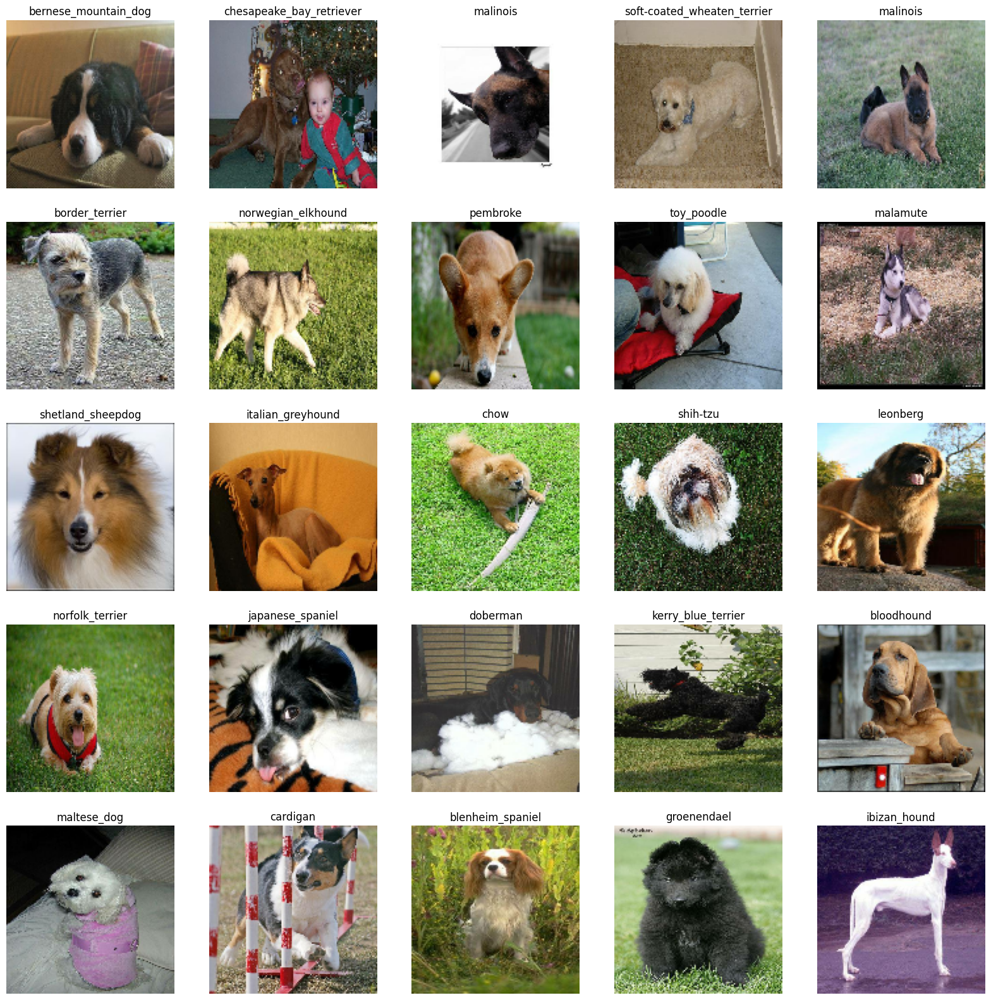

In [67]:
# Now let's visualize the data in a training batch
show_images_from_data_batch(train_images, train_labels)

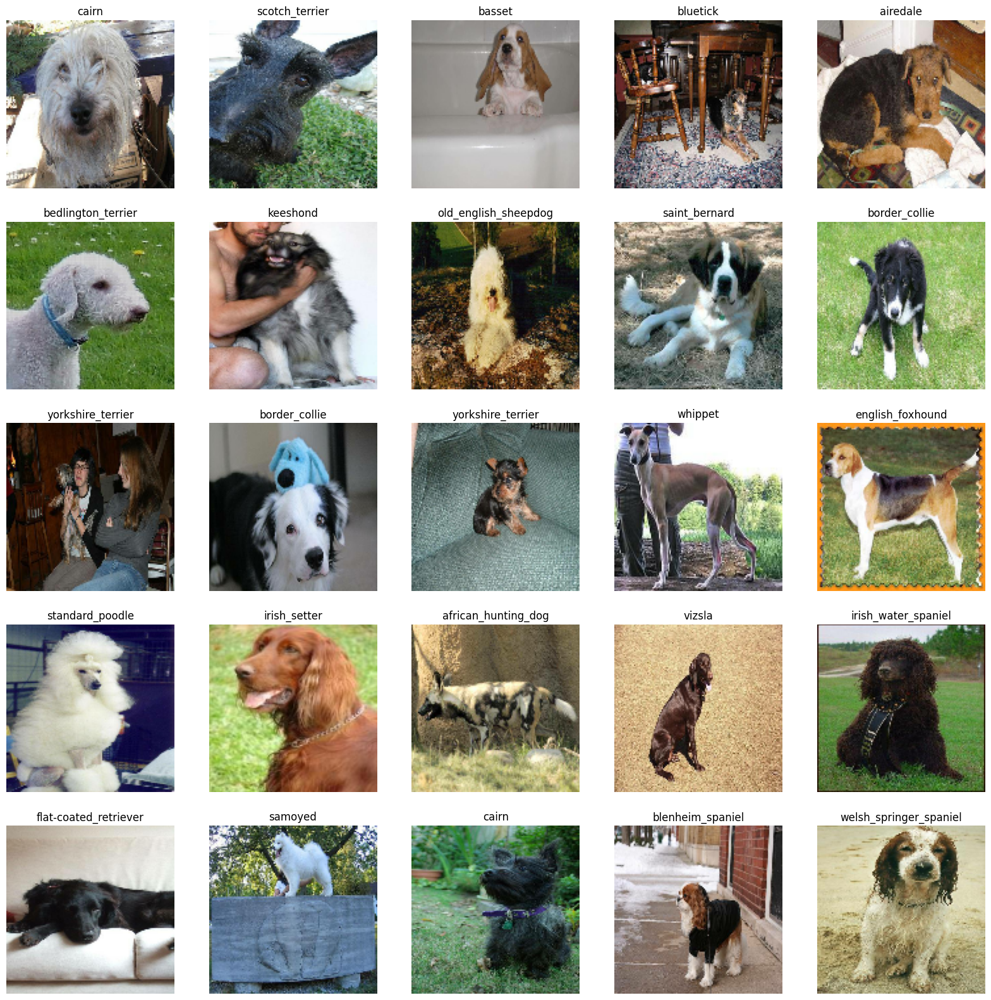

In [68]:
# Now let's visualize our validation set
val_images, val_labels = next(validation_data.as_numpy_iterator())
show_images_from_data_batch(val_images, val_labels)

## Building a Model

Before we build a model, there are a few things we need to define:
* The input shape (the shape of our images, in the form of Tensors) of our model.
* The output shape (image labels, in the form of Tensors) of our model.
* The URL of the model we want to use: https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/035-128-classification/2

In [28]:
# Set up input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3]  # batch, height, width, color channels

# Setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

# Set up model URL from TensorFlow Hub
MODEL_URL = 'https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/035-128-classification/2'

Now we've got our inputs, outputs, and model ready to go. Let's put them together into a Keras deep learning model.

Knowing this, let's create a function which:
* Takes the input shape, output shape, and the model we've chosen as parameters.
* Defines the layers in a Keras model in a sequential fashion (linear step-by-step process).
* Compiles the model (says how it should be evaluated and improved).
* Builds the model (tells the model the input shape it will be getting).
* Returns the model.

In [29]:
# Create a function which builds a Keras model
def create_model(
        input_shape: List[Optional[int]] = INPUT_SHAPE,
        output_shape: int = OUTPUT_SHAPE,
        model_url: str = MODEL_URL,
) -> Sequential:
    """
    Builds and compiles a Keras Sequential model based on a pre-trained model from TensorFlow Hub.
    
    :param input_shape: List specifying the shape of the input data. It typically includes batch size, height, width, and color channels. Defaults to `INPUT_SHAPE`.
    :param output_shape: Integer specifying the number of output classes (e.g., number of unique breeds). Defaults to `OUTPUT_SHAPE`.
    :param model_url: String URL pointing to the pre-trained model on TensorFlow Hub. Defaults to `MODEL_URL`.
    :return: A compiled Keras Sequential model ready for training or evaluation.
    """

    print(f'Building model with: {model_url}')

    # Set up the model layers
    model = tf.keras.Sequential([
        hub.KerasLayer(model_url),  # Layer 1 (input layer)
        tf.keras.layers.Dense(
            units = output_shape,
            activation = 'softmax',
        ),  # Layer 2 (output layer)
    ])

    # Compile the model
    model.compile(
        loss = tf.keras.losses.CategoricalCrossentropy(),
        optimizer = tf.keras.optimizers.Adam(),
        metrics = [
            'accuracy'
        ]
    )

    # Build the model
    model.build(input_shape)

    return model

In [30]:
model = create_model()

Building model with: https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/035-128-classification/2


In [31]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              1692489   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 1,812,729
Trainable params: 120,240
Non-trainable params: 1,692,489
_________________________________________________________________


## Creating Callbacks

Callbacks are helper functions a model can use during training to do things such as save and check its progress, or stop training early if a model stops improving.

We'll create 2 callbacks; one for TensorBoard, which helps track our model's progress, and another for early stopping, which prevents our model from training for too long.

### TensorBoard Callback
To set up a TensorBoard callback, we need to do 3 things:
1. Load the TensorBoard notebook extension
2. Create a TensorBoard callback which is able to save logs to a directory, and pass it to our model's `fit()` function
3. Visualize our model's training logs with the `%tensorboard` magic function

In [2]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [32]:
# Create a function to build a TensorBoard callback
def create_tensorboard_callback() -> TensorBoard:
    """
    Creates and returns a TensorBoard callback for use in training Keras models.
    
    The callback logs training metrics to a directory (`logs/`) organized by timestamp,
    enabling visualization in TensorBoard.

    :return: A `TensorBoard` callback instance that logs data for TensorBoard visualization.
    """

    # Create a log directory for storing TensorBoard logs
    log_dir = os.path.join(
        'logs',
        dt.datetime.now().strftime('%Y%m%d-%H%M%S'),  # Make it so the logs get tracked whenever we run an experiment
    )

    return tf.keras.callbacks.TensorBoard(log_dir)

### Early Stopping Callback

Early stopping helps stop our model from overfitting by stopping training if a certain evaluation metric stops improving

In [33]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor = 'val_accuracy',
    patience = 3,
)

## Training a model (on a subset of data)

Our first model is only going to train on 1000 images, to make sure everything is working.

In [34]:
NUM_EPOCHS = 100

Let's create a function which trains a model.

* Create a model using `create_model()`
* Set up a TensorBoard callback using `create_tensorboard_callback()`
* Call the `fit()` function on our model passing it the training data, validation data, number of epochs to train for, and the callbacks.
* Return the model  

In [35]:
# Build a function to train and return a trained model
def train_model() -> Sequential:
    """
    Trains a Keras Sequential model using the specified training and validation data, 
    and returns the trained model.
    
    The function creates a new model, initializes a TensorBoard callback, 
    and fits the model to the training data, validating on the validation data.
    
    :return: The trained Keras Sequential model.
    """

    # Create a model
    model: Sequential = create_model()

    # Create new TensorBoard session everytime we train a model
    tensorboard = create_tensorboard_callback()

    # Fit the model to the data passing it the callbacks we created
    model.fit(
        x = train_data,
        epochs = NUM_EPOCHS,
        validation_data = validation_data,
        validation_freq = 1,
        callbacks = [tensorboard, early_stopping]
    )

    # Return the fitted model
    return model

In [36]:
# Fit the model to the data
model = train_model()

Building model with: https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/035-128-classification/2
Epoch 1/100
25/25 [==============================] - 10s 188ms/step - loss: 5.5347 - accuracy: 0.0450 - val_loss: 4.6155 - val_accuracy: 0.1300
Epoch 2/100
25/25 [==============================] - 4s 167ms/step - loss: 2.4014 - accuracy: 0.4038 - val_loss: 3.7296 - val_accuracy: 0.2150
Epoch 3/100
25/25 [==============================] - 4s 170ms/step - loss: 1.0626 - accuracy: 0.7775 - val_loss: 3.4888 - val_accuracy: 0.2450
Epoch 4/100
25/25 [==============================] - 4s 166ms/step - loss: 0.5057 - accuracy: 0.9475 - val_loss: 3.4213 - val_accuracy: 0.2500
Epoch 5/100
25/25 [==============================] - 4s 162ms/step - loss: 0.2704 - accuracy: 0.9937 - val_loss: 3.4871 - val_accuracy: 0.2700
Epoch 6/100
25/25 [==============================] - 4s 165ms/step - loss: 0.1672 - accuracy: 1.0000 - val_loss: 3.4798 - val_accuracy: 0.2600
Epoch 7/100
25/25 [==============

### Checking the TensorBoard Logs

The TensorBoard magic function (`%tensorboard`) will access the `logs` directory and visualize its contents.

In [3]:
%tensorboard --logdir logs

Reusing TensorBoard on port 6006 (pid 26347), started 0:11:26 ago. (Use '!kill 26347' to kill it.)

## Making and evaluating predictions using a trained model

In [38]:
# Make predictions on the validation data (not used to train)
predictions: np.array = model.predict(
    validation_data,
    verbose = 1
)
predictions

7/7 [==============================] - 1s 147ms/step


array([[1.5157249e-04, 1.9874733e-03, 2.8502342e-05, ..., 6.9664289e-05,
        6.6247410e-03, 4.3472326e-03],
       [3.1804718e-04, 2.3966832e-05, 6.8633035e-02, ..., 1.4342490e-04,
        6.4936682e-04, 7.6585950e-04],
       [7.2053008e-06, 2.7177874e-03, 1.8613249e-05, ..., 1.9193858e-02,
        2.2775620e-04, 8.0518179e-02],
       ...,
       [5.0426697e-06, 2.9151342e-03, 5.2768667e-04, ..., 2.6491098e-04,
        2.9672583e-04, 9.3739040e-02],
       [2.1353942e-04, 1.2551247e-03, 3.7802933e-05, ..., 2.5113279e-03,
        1.8190896e-05, 2.5833197e-04],
       [7.5335825e-05, 2.8521035e-04, 3.3734387e-04, ..., 1.8174513e-04,
        4.8630051e-03, 2.1123700e-04]], dtype=float32)

In [39]:
predictions.shape

(200, 120)

In [41]:
# This is where the shape comes from ^
len(y_val), len(unique_breeds)

(200, 120)

In [43]:
np.sum(predictions[0])

1.0

In [53]:
# First Predictions
index = 42

print(predictions[index])
print(f'Max value (probability of prediction): {np.max(predictions[index])}')
print(f'Sum: {np.sum(predictions[index])}')
print(f'Max index: {np.argmax(predictions[index])}')
print(f'Predicted label: {unique_breeds[np.argmax(predictions[index])]}')

[1.98841531e-06 2.02339128e-04 1.22592540e-03 2.20782124e-03
 2.42161535e-04 3.38528516e-05 3.51901508e-05 1.67246745e-03
 1.81150471e-03 8.72160308e-03 4.51906926e-05 1.22435202e-04
 1.30875836e-04 6.59877248e-03 3.63054080e-03 2.25640833e-01
 8.17382102e-07 2.50273064e-04 3.06980242e-03 4.14850796e-03
 4.52734748e-05 2.69328197e-03 1.10155383e-06 7.80588744e-06
 3.95667320e-03 9.98457399e-05 1.60054660e-05 6.10068033e-04
 2.23643714e-04 5.93989080e-06 9.39386300e-05 1.84269651e-04
 1.50496082e-04 5.79947780e-04 4.85713235e-06 5.21604125e-05
 5.46387048e-04 1.15237373e-03 1.87204685e-04 3.50759029e-01
 1.45360114e-04 5.51574794e-06 6.06102031e-03 2.19507026e-03
 7.09112010e-06 6.05505784e-06 3.89854726e-03 1.83726661e-03
 1.85340250e-05 3.81944003e-03 7.06480874e-04 7.61903502e-05
 7.70612271e-04 1.28366984e-04 1.30145549e-04 2.00467929e-02
 4.83608164e-05 9.06415109e-04 1.31471432e-04 4.28359526e-05
 6.37861604e-06 1.55697577e-04 2.04521384e-05 7.72064709e-07
 4.58411851e-05 1.901051

Having the above functionality is great, but we want to do it at scale.

It would be better if we could see the image the prediction is made on.

In [54]:
def get_pred_label(pred_probs: np.array) -> str:
    """
    Converts an array of prediction probabilities into the corresponding label.

    The function takes the prediction probabilities output from a model,
    finds the index of the highest probability, and returns the label
    corresponding to that index.

    :param pred_probs: A numpy array containing prediction probabilities for each class.
    :return: The label (string) corresponding to the highest probability.
    """

    return unique_breeds[np.argmax(pred_probs)]

In [57]:
# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[42])
pred_label

'english_foxhound'

In [60]:
validation_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 128, 128, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

Since our validation data is still in a batch dataset, we'll have to un-batch it to make predictions on the validation images and then compare those predictions to the validation labels (truth labels).

In [77]:
def unbatch_data(data: tf.data.Dataset) -> Tuple[List[np.ndarray], List[np.ndarray]]:
    """
    Takes a batched dataset of (image, label) Tensors and returns separate lists of images and labels as numpy arrays.

    :param data: A TensorFlow `tf.data.Dataset` containing batches of (image, label) pairs.
    :return: A tuple containing two lists:
             - List of images as numpy arrays.
             - List of labels as numpy arrays.
    """

    images, labels = [], []

    # Loop through un-batched data
    for image, label in data.unbatch().as_numpy_iterator():
        images.append(image)
        labels.append(unique_breeds[np.argmax(label)])

    return images, labels

In [78]:
val_images, val_labels = unbatch_data(validation_data)

In [79]:
val_images[0], val_labels[0]

(array([[[0.25828475, 0.36198825, 0.24389817],
         [0.39360544, 0.3418826 , 0.30183154],
         [0.8296768 , 0.7504122 , 0.74760556],
         ...,
         [0.8228947 , 0.8611053 , 0.8719636 ],
         [0.76902866, 0.8160875 , 0.8079686 ],
         [0.8183106 , 0.82737565, 0.84341663]],
 
        [[0.30484715, 0.29425842, 0.2039199 ],
         [0.4352226 , 0.37971696, 0.31883615],
         [0.8593526 , 0.80739874, 0.77293175],
         ...,
         [0.85530514, 0.89059925, 0.917223  ],
         [0.80846506, 0.8516023 , 0.8737746 ],
         [0.7754192 , 0.8053707 , 0.84239584]],
 
        [[0.75496686, 0.6921665 , 0.66526437],
         [0.807427  , 0.804948  , 0.7710658 ],
         [0.9814564 , 0.9935267 , 0.971697  ],
         ...,
         [0.91192657, 0.94484705, 0.9793709 ],
         [0.8952671 , 0.9312506 , 0.98800606],
         [0.8093318 , 0.85525966, 0.91700304]],
 
        ...,
 
        [[0.45503026, 0.4585416 , 0.41656855],
         [0.5492001 , 0.5392863 , 0.49725

Now we've got ways to get:
* Prediction labels
* Validation labels (truth labels)
* Validation images

Let's make some functions to make these more visual.

We'll create a function which:
* Takes an array of prediction probabilities, an array of truth labels, and an array of images and integers.
* Convert the prediction probabilities to a prediction label
* Plot the predicted label, its predicted probability, and the target image on a single plot.

In [91]:
def plot_pred(pred_probs: np.ndarray, labels: List[str], images: List[np.ndarray], index: int = 1) -> None:
    """
    View the prediction, ground truth, and image for sample `n`.

    :param pred_probs: An array of prediction probabilities from the model, where each entry is an array of probabilities for each class.
    :param labels: A list of ground truth labels corresponding to the images.
    :param images: A list of images as numpy arrays.
    :param index: The index of the sample to display (default is 1).
    :return: None. The function displays a plot showing the image, predicted label, probability, and true label.
    """
    pred_prob, true_label, image = pred_probs[index], labels[index], images[index]

    # Get the predicted label
    pred_label = get_pred_label(pred_prob)

    # Plot the image and remove axis ticks
    plt.imshow(image)
    plt.xticks([])
    plt.yticks([])

    # Change the color of the title depending on if the prediction is true or false

    if pred_label == true_label:
        color = 'green'
    else:
        color = 'red'

    # Set the plot title to display predicted label, probability, and true label
    plt.title(
        '{} {:2.0f}% {}'
        .format(
            pred_label,
            np.max(pred_prob) * 100,
            true_label,
        ),
        color = color
    )

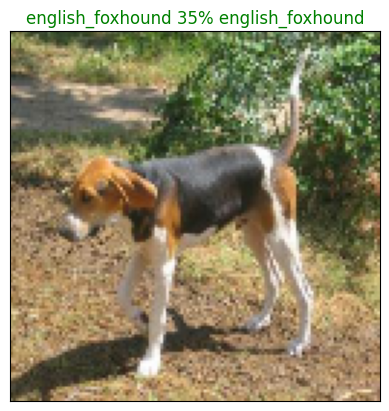

In [92]:
plot_pred(
    pred_probs = predictions,
    labels = val_labels,
    images = val_images,
    index = 42,
)

Now we've got one function to visualize our model's top prediction, let's make another to view our model's top 10 predictions

This function will:
* Take an input of a prediction probability array and a ground truth array, and an int
* Find the prediction using `get_pred_label()`
* Find the top 10:
    * Prediction probabilities indexes
    * Prediction probabilities values
    * Prediction labels
* Plot the top 10 prediction probability values and labels; coloring the true label green

In [95]:
def plot_pred_conf(prediction_probabilities: np.ndarray, labels: List[str], n: int = 1) -> None:
    """
    Plots the top 10 highest prediction confidences along with the true label for sample `n`.

    :param prediction_probabilities: A numpy array of prediction probabilities from the model, where each entry is an array of probabilities for each class.
    :param labels: A list of ground truth labels corresponding to the data samples.
    :param n: The index of the sample to display (default is 1).
    :return: None. The function displays a bar plot showing the top 10 prediction confidences for the specified sample.
    """

    pred_prob, true_label = prediction_probabilities[n], labels[n]

    # Get the predicted label
    _pred_label = get_pred_label(pred_prob)

    # Find the top 10 prediction confidence indexes
    top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]

    # Find the top 10 prediction confidence values
    top_10_pred_values = pred_prob[top_10_pred_indexes]

    # Find the top 10 prediction labels
    top_10_pred_labels = unique_breeds[top_10_pred_indexes]

    # Setup plot
    top_plot = plt.bar(
        np.arange(len(top_10_pred_labels)),
        top_10_pred_values,
        color = 'grey',
    )

    plt.xticks(
        np.arange(len(top_10_pred_labels)),
        labels = top_10_pred_labels,
        rotation = 'vertical',
    )

    # Change color of true labels
    if np.isin(true_label, top_10_pred_labels):
        top_plot[np.argmax(top_10_pred_labels == true_label)].set_color('green')


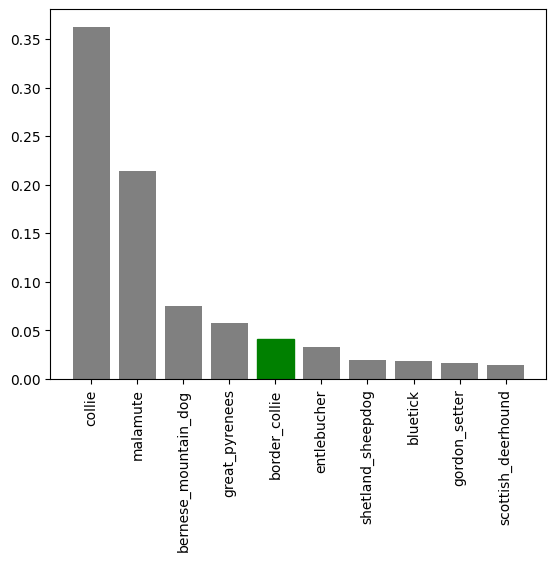

In [96]:
plot_pred_conf(
    prediction_probabilities = predictions,
    labels = val_labels,
    n = 9,
)

Now we've got some functions to help us visualize our predictions and evaluate our model. Let's check out a few.

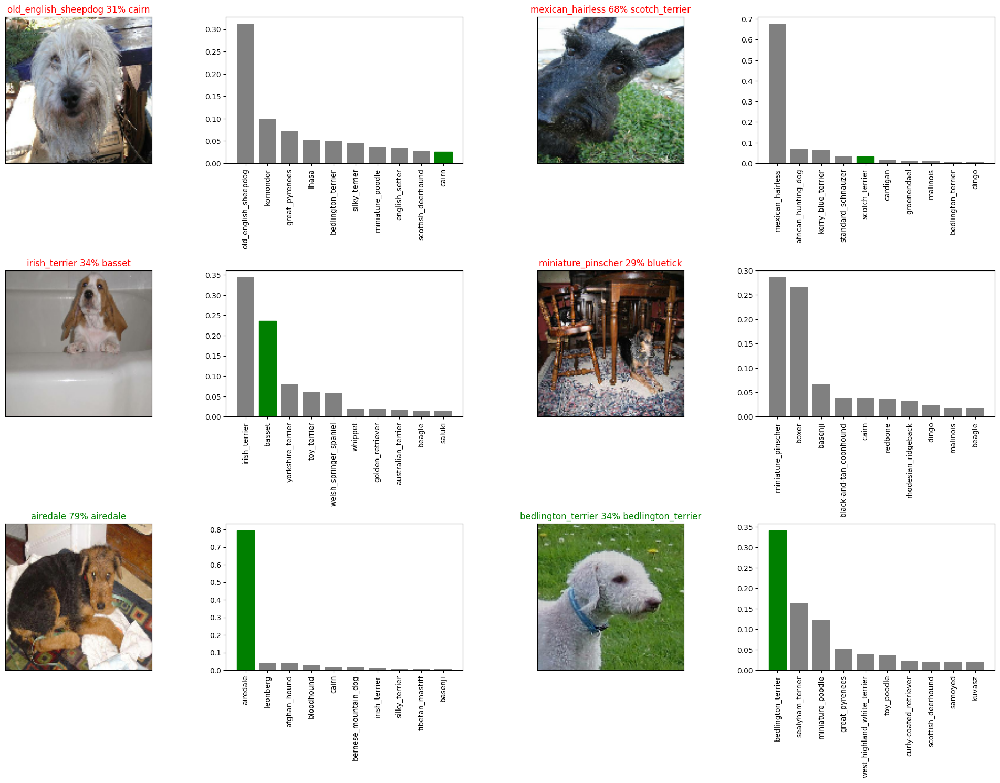

In [103]:
# Let's check out a few predictions and their different values
i_multiplier = 0
num_rows = 3
num_cols = 2
num_images = num_rows * num_cols

plt.figure(figsize = (10 * num_cols, 5 * num_rows))

for i in range(num_images):
    plt.subplot(num_rows, 2 * num_cols, 2 * i + 1)
    plot_pred(
        pred_probs = predictions,
        labels = val_labels,
        images = val_images,
        index = i + i_multiplier,
    )
    plt.subplot(num_rows, 2 * num_cols, 2 * i + 2)
    plot_pred_conf(
        prediction_probabilities = predictions,
        labels = val_labels,
        n = i + i_multiplier
    )
plt.tight_layout(h_pad = 1)
plt.show()

## Saving and reloading a trained model

In [108]:
def save_model(model: Sequential, suffix = Optional[str]) -> str:
    """
    Saves a given Keras Sequential model in the `models` directory with an optional suffix appended to the filename.

    The model is saved in the HDF5 (.h5) format, with the filename including the current timestamp and the provided suffix.

    :param model: The Keras Sequential model to be saved.
    :param suffix: An optional string suffix to append to the model filename. If not provided, an empty string is used.
    :return: The file path where the model is saved.
    """

    # Create a model directory pathname with the current time
    model_dir = os.path.join(
        'models',
        dt.datetime.now().strftime('%Y%m%d-%H%M%s')
    )
    model_path = model_dir + '-' + suffix + '.h5'  # Save format of model
    print(f'Saving model to: {model_path}...')
    model.save(model_path)
    return model_path

In [107]:
def load_model(model_path: str) -> Sequential:
    """
    Loads a saved Keras Sequential model from a specified file path.

    The function assumes the model was saved with TensorFlow Hub layers, and will correctly load those layers.

    :param model_path: The file path to the saved model (in .h5 format).
    :return: The loaded Keras Sequential model.
    """

    print(f'Loading saved model from {model_path}')
    model = tf.keras.models.load_model(
        model_path,
        custom_objects = {
            'KerasLayer': hub.KerasLayer,
        },
    )
    return model

Now we've got functions to save and load a trained model

In [109]:
# Save our model trained on 1000 images
save_model(model, suffix = '1000-images-mobilenetv2-Adam')

Saving model to: models/20240901-19581725242329-1000-images-mobilenetv2-Adam.h5...


'models/20240901-19581725242329-1000-images-mobilenetv2-Adam.h5'

In [110]:
# Load a trained model
loaded_1000_image_model = load_model('models/20240901-19581725242329-1000-images-mobilenetv2-Adam.h5')

Loading saved model from models/20240901-19581725242329-1000-images-mobilenetv2-Adam.h5


In [111]:
# Evaluate the pre-saved model
model.evaluate(validation_data)

7/7 [==============================] - 1s 86ms/step - loss: 3.5047 - accuracy: 0.2500


[3.5047271251678467, 0.25]

In [112]:
# Evaluate the loaded model
loaded_1000_image_model.evaluate(validation_data)

7/7 [==============================] - 1s 92ms/step - loss: 3.5047 - accuracy: 0.2500


[3.5047271251678467, 0.25]

## Training a model on the full data

In [115]:
# Create a data-batch with the full data-set
full_data: tf.data.Dataset = create_data_batches(X, y)

Creating training data batches...


In [116]:
full_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 128, 128, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [117]:
# Create a model for full data-set
full_model: Sequential = create_model()

Building model with: https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/035-128-classification/2


In [118]:
# Create full model callbacks
full_model_tensorboard: TensorBoard = create_tensorboard_callback()

# No validation set when training on all the data; so we can't monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor = 'accuracy',
    patience = 3,
)

**Note:** Running the below cell will take some time as we have to load all the images into memory.

In [119]:
# Fit the full model to the full data
full_model.fit(
    x = full_data,
    epochs = NUM_EPOCHS,
    callbacks = [
        full_model_tensorboard,
        full_model_early_stopping,
    ]
)

Epoch 1/100
320/320 [==============================] - 40s 112ms/step - loss: 2.8783 - accuracy: 0.3266
Epoch 2/100
320/320 [==============================] - 47s 148ms/step - loss: 1.6373 - accuracy: 0.5529
Epoch 3/100
320/320 [==============================] - 43s 134ms/step - loss: 1.2791 - accuracy: 0.6343
Epoch 4/100
320/320 [==============================] - 41s 128ms/step - loss: 1.0340 - accuracy: 0.6995
Epoch 5/100
320/320 [==============================] - 43s 134ms/step - loss: 0.8477 - accuracy: 0.7528
Epoch 6/100
320/320 [==============================] - 47s 147ms/step - loss: 0.7122 - accuracy: 0.7938
Epoch 7/100
320/320 [==============================] - 47s 145ms/step - loss: 0.5998 - accuracy: 0.8282
Epoch 8/100
320/320 [==============================] - 47s 147ms/step - loss: 0.5056 - accuracy: 0.8573
Epoch 9/100
320/320 [==============================] - 57s 178ms/step - loss: 0.4257 - accuracy: 0.8867
Epoch 10/100
320/320 [==============================] - 54s 170m

In [120]:
save_model(full_model, suffix = 'full-image-set-mobilenetv2-Adam')

Saving model to: models/20240901-21251725247505-full-image-set-mobilenetv2-Adam.h5...


'models/20240901-21251725247505-full-image-set-mobilenetv2-Adam.h5'

In [122]:
# Load in the full model
loaded_full_model: Sequential = load_model('models/20240901-21251725247505-full-image-set-mobilenetv2-Adam.h5')

Loading saved model from models/20240901-21251725247505-full-image-set-mobilenetv2-Adam.h5


## Making predictions on the test dataset

Since our model has been trained on images in the form of Tensor batches, to make predictions on the test data, we'll have to get it into the same format.

Luckily we created `create_data_batches()` earlier which takes a list of filenames as input and convert them to Tensor batches.

To make predictions on the test data, we'll:
* Get the test image filenames
* Convert the filenames into test data batches using `create_data_batches()` and setting the `test_data` parameter to `True` (since the test data doesn't have labels).
* Make a predictions array by passing the test batches to the `predict()` method called on our model.

In [123]:
# Load test image filenames
test_path = 'data/dog-breed-identification/test/'
test_filenames = [
    test_path + fname for fname in os.listdir(test_path)
]
test_filenames[:10]

['data/dog-breed-identification/test/266490a2b053a4a3bf68e779f28fb5a9.jpg',
 'data/dog-breed-identification/test/dae9fd18836d8df20989ef0101771d4b.jpg',
 'data/dog-breed-identification/test/079a40f22b0fad9a66f76797b62bb930.jpg',
 'data/dog-breed-identification/test/ab8462f9a501d362041d47582fddc9ad.jpg',
 'data/dog-breed-identification/test/8895089b432e020cc42e6262b5a1c2dd.jpg',
 'data/dog-breed-identification/test/985ae7fc271ac4a0d131e546c0f95bb6.jpg',
 'data/dog-breed-identification/test/77c1ab99cffb817d54fb14f229aeb118.jpg',
 'data/dog-breed-identification/test/ad7e50abca9b7c6a88b63946c5bbe493.jpg',
 'data/dog-breed-identification/test/d61a09cecf56666cdb315ebce4b93c43.jpg',
 'data/dog-breed-identification/test/cb120c57904e8c0694bbe259c58a873c.jpg']

In [124]:
len(test_filenames)

10357

In [125]:
# Create test data batch
test_data: tf.data.Dataset = create_data_batches(
    test_filenames,
    test_data = True,
)

Creating test data batches...


In [126]:
test_data

<BatchDataset element_spec=TensorSpec(shape=(None, 128, 128, 3), dtype=tf.float32, name=None)>

**Note:** Calling `predict()` on our full model and passing it the test data batch will take a long time to run.

In [127]:
# Make predictions on test data batch using the loaded full model
test_predictions: Sequential = loaded_full_model.predict(
    test_data,
    verbose = 1,
)

324/324 [==============================] - 36s 106ms/step


In [128]:
# Save predictions to csv file
np.savetxt(
    'data/preds_array.csv',
    test_predictions,
    delimiter = ',',
)

In [129]:
test_predictions[:10]

array([[8.1894536e-09, 2.6331581e-14, 3.6184929e-07, ..., 6.6378942e-07,
        4.0761332e-16, 7.8718716e-14],
       [2.1307236e-03, 6.0322072e-05, 1.4273963e-10, ..., 3.8350109e-08,
        8.6941094e-09, 8.7502059e-09],
       [1.3386034e-14, 1.4458980e-12, 2.0177552e-17, ..., 9.2130666e-20,
        8.4838085e-22, 1.0815262e-19],
       ...,
       [6.3218906e-09, 2.2422492e-03, 1.0713656e-14, ..., 4.6592820e-04,
        1.9323377e-06, 1.2071991e-08],
       [2.3492098e-07, 8.7237629e-07, 2.0856765e-10, ..., 3.6057144e-13,
        3.2563433e-16, 1.6435944e-08],
       [1.7733804e-12, 1.8153076e-11, 8.5346074e-15, ..., 5.5723242e-11,
        1.0679234e-08, 2.7845118e-07]], dtype=float32)

In [131]:
test_predictions.shape

(10357, 120)

## Preparing test dataset predictions

We will put our model's prediction probability outputs in a DataFrame with an ID column, and a column for each different dog breed type.

To get the data in this format, we'll:
* Create a pandas DataFrame with an ID column, as well as for each dog breed
* Add data to the ID column by extracting the test image ID's from their filepaths
* Add data (the prediction probabilities) to each of the dog breed columns
* Export the DataFrame as a .csv file

In [132]:
# Create a pandas DataFrame with empty columns
preds_df = pd.DataFrame(
    columns = ['id'] + list(unique_breeds),
)
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [139]:
# Append test image IDs' to predictions DataFrame
test_ids = [
    os.path.splitext(path)[0] for path in os.listdir(test_path)
]
preds_df['id'] = test_ids

In [140]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,266490a2b053a4a3bf68e779f28fb5a9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,dae9fd18836d8df20989ef0101771d4b,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,079a40f22b0fad9a66f76797b62bb930,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,ab8462f9a501d362041d47582fddc9ad,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,8895089b432e020cc42e6262b5a1c2dd,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [141]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,266490a2b053a4a3bf68e779f28fb5a9,8.189454e-09,2.633158e-14,3.618493e-07,1.476687e-11,2.395285e-05,2.464933e-07,7.637192e-14,2.959652e-11,5.148746e-05,...,7.712790e-13,1.537762e-11,1.866279e-08,1.364701e-08,4.264518e-03,2.590810e-16,1.098777e-16,6.637894e-07,4.076133e-16,7.871872e-14
1,dae9fd18836d8df20989ef0101771d4b,2.130724e-03,6.032207e-05,1.427396e-10,2.280162e-11,1.625388e-09,2.659264e-15,1.950262e-06,3.168091e-14,5.492417e-11,...,5.173679e-08,8.274893e-13,9.466340e-12,3.900416e-15,1.867657e-11,1.433627e-08,5.871734e-12,3.835011e-08,8.694109e-09,8.750206e-09
2,079a40f22b0fad9a66f76797b62bb930,1.338603e-14,1.445898e-12,2.017755e-17,3.288534e-18,4.362416e-20,2.127735e-20,7.072619e-18,4.342405e-22,1.472740e-17,...,7.810936e-12,2.818389e-23,1.171183e-16,1.836011e-16,2.306296e-22,1.297172e-17,9.671042e-24,9.213067e-20,8.483809e-22,1.081526e-19
3,ab8462f9a501d362041d47582fddc9ad,5.816894e-03,2.988312e-07,2.435474e-15,3.220916e-02,6.456746e-10,1.580458e-06,1.061686e-02,5.417322e-14,1.693988e-11,...,1.229694e-07,4.150430e-06,3.584949e-11,1.164040e-11,1.689663e-08,1.488486e-08,6.556397e-05,5.811855e-08,1.652782e-05,5.367730e-01
4,8895089b432e020cc42e6262b5a1c2dd,3.292787e-12,1.028217e-08,1.418299e-10,1.418542e-10,4.305804e-10,2.650926e-12,1.755288e-06,7.832687e-03,3.107084e-06,...,2.029157e-09,8.448893e-08,1.854837e-05,3.334555e-10,6.567232e-14,1.194533e-09,3.402924e-14,9.309078e-11,7.567367e-13,7.875240e-10


In [142]:
# Save our predictions and export to csv
preds_df.to_csv(
    'data/full_model_predictions.csv',
    index = False,
)

## Making predictions on custom images

To make prediction on custom images we'll:
* Get the filepaths of our own images.
* Turn the filepaths into data batches using `create_data_batches.()`. And since our custom images won't have labels, we set the `test_data` parameter to `True`.
* Pass the custom image data batch to our model's `predict()` method.
* Convert the prediction output probabilities to prediction labels.
* Compare the predicted labels to the custom images.

In [163]:
# Get custom image filepaths
custom_path = 'images/'
custom_image_paths = [
    custom_path + fname for fname in os.listdir(custom_path)
]

In [164]:
custom_image_paths

['images/doggy2.jpg', 'images/doggy3.jpg', 'images/doggy.png']

In [165]:
# Turn custom images into batch datasets
custom_data = create_data_batches(
    custom_image_paths,
    test_data = True,
)
custom_data

Creating test data batches...


<BatchDataset element_spec=TensorSpec(shape=(None, 128, 128, 3), dtype=tf.float32, name=None)>

In [166]:
# Make predictions on the custom data
custom_preds = loaded_full_model.predict(custom_data)

1/1 [==============================] - 0s 154ms/step


In [167]:
custom_preds.shape

(3, 120)

In [168]:
# Get custom image prediction labels
custom_pred_labels = [
    get_pred_label(custom_preds[i]) for i in range(len(custom_preds))
]
custom_pred_labels

['boston_bull', 'basenji', 'boston_bull']

In [169]:
# Get custom images
custom_images = []

#Loop through un-batched data
for image in custom_data.unbatch().as_numpy_iterator():
    custom_images.append(image)

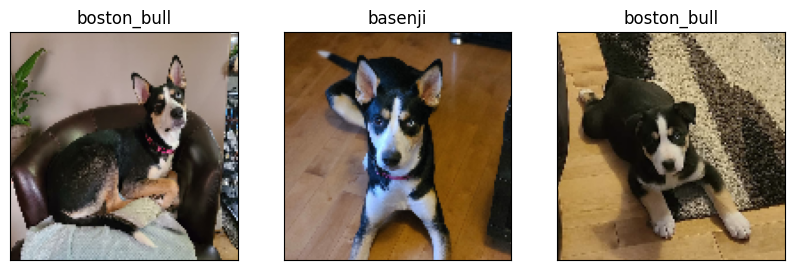

In [172]:
# Check custom image predictions
plt.figure(figsize = (10, 10))
for i, image in enumerate(custom_images):
    plt.subplot(1, 3, i + 1)
    plt.xticks([])
    plt.yticks([])
    plt.title(custom_pred_labels[i])
    plt.imshow(image)